# Travel Destination Recommendation System Notebook

#### Authors
* 1 Dennis Mwanzia
* 2 Pamela Owino
* 3 Joshua Rwanda
* 4 Nelson Kemboi
* 5 Pauline Wambui
* 6 Kane Muendo
* 7 Ian Macharia


## Problem Statement

Tourists visiting Africa often struggle to find suitable travel destinations that align with their preferences, making it challenging to plan a satisfying trip within their budget and time constraints. 

Our main aim as AfricuraAI is to develop a machine learning model i.e. recommendation system that provides personalized recommendations for the best tourist destinations in Africa. By considering customer reviews, budget constraints, specific locations, available amenities, and residence type, the model aims to suggest the ideal tourist destination that aligns with the user's preferences.

By analyzing the text reviews along with the additional factors available in the dataset, the project seeks to build a model that accurately predicts the preferred tourist destination for both new and existing users. The model will take into account factors such as customer reviews, budget limitations, location preferences, amenities, physical attractions, and residence type to recommend the most suitable tourist destination in Africa.

The value of this project lies in its ability to address the real-world problem of providing personalized recommendations for tourists in their search for the best tourist destinations in Africa. By utilizing machine learning algorithms and analyzing a range of factors, the project aims to enhance the travel experience for users by suggesting destinations that meet their preferences and requirements.

## Objectives

The goal is to build a machine learning model that can accurately predict hotel ratings based on customer reviews, budget constraints, specific locations, and the type of residence. By analyzing the text reviews and incorporating additional factors, such as sentiment analysis, budget range, geographical distance, and residence type, the objective is to develop a robust model that can make accurate predictions for new, unseen hotels. The model will help users make informed decisions when selecting hotels by considering their preferences and constraints.

#### Specifics

> To create a Recommendation system that can be used to suggest travel destinations based on budget.

> To identify top destinations in Africa

> To foster customer loyalty and repeat customers, building long term relationships between customers and travel destinations. 

> To increase customer engagement  and satisfaction by providing comprehensive and accurate information about tourist destinations.

> To generate revenue by engaging travel destinations to have them listed on the site.

> To collect user information and feedback to improve the recommendations in the long run.

## Data Understanding

In [248]:
# We started by Importing the necessary libraries
import pandas as pd
import json
import glob
import re
import folium

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go


import warnings

warnings.filterwarnings('ignore')
sns.set_style('darkgrid')

In [249]:
#We created a function to read json files
def read_json_files(json_files):
    dfs = []
    for file in json_files:
        with open(file, encoding='utf-8') as f:
            json_data = json.load(f)
            df = pd.DataFrame(json_data)
            dfs.append(df)

    merged_df = pd.concat(dfs, ignore_index=True)
    return merged_df


In [250]:
json_files = json_files = ['../Data/botswana.json', '../Data/capeverde.json', '../Data/drc.json', '../Data/egypt.json',
                           '../Data/ethiopia.json', '../Data/ghana.json', '../Data/kenya.json','../Data/madagascar.json',
                           '../Data/malawi.json', '../Data/morocco.json', '../Data/namibia.json', '../Data/nigeria.json',
                           '../Data/rwanda.json','../Data/senegal.json', '../Data/seychelles.json', '../Data/south_africa.json',
                           '../Data/tanzania.json', '../Data/uganda.json', '../Data/zambia.json']
df = read_json_files(json_files)
df.head()

,id,type,category,subcategories,name,locationString,description,image,photoCount,awards,...,menuWebUrl,establishmentTypes,ownersTopReasons,guideFeaturedInCopy,rentalDescriptions,photos,bedroomInfo,bathroomInfo,bathCount,baseDailyRate
0,1171922,ATTRACTION,attraction,[Sights & Landmarks],Khwai River Bridge,"Okavango Delta, North-West District",None,https://media-cdn.tripadvisor.com/media/photo-...,24,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2513264,ATTRACTION,attraction,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,https://media-cdn.tripadvisor.com/media/photo-...,84,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3247057,ATTRACTION,attraction,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,https://media-cdn.tripadvisor.com/media/photo-...,21,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,478934,ATTRACTION,attraction,[Nature & Parks],Serondela Reserve,"Chobe National Park, North-West District",This region of Chobe National Park is known as...,https://media-cdn.tripadvisor.com/media/photo-...,65,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7931216,ATTRACTION,attraction,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,https://media-cdn.tripadvisor.com/media/photo-...,26,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Data Cleaning


Methodology for cleaning the dataset:

* Data Understanding: We took time to understand the data and its structure. We Identified the columns or attributes that are relevant for our analysis.

* Remove Irrelevant Data: We removed irrelevant columns for our analysis.

* Handle Missing Values.

* Standardize Formats.

* Remove Duplicates.

* Handle Outliers.

* Text Cleaning.

* Normalize and Categorize Data.

* Validate Data Integrity

### Data Understanding

In [251]:
# Checking the Data structure 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35836 entries, 0 to 35835
Data columns (total 65 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     35836 non-null  object 
 1   type                   35836 non-null  object 
 2   category               35836 non-null  object 
 3   subcategories          34497 non-null  object 
 4   name                   35836 non-null  object 
 5   locationString         34497 non-null  object 
 6   description            20129 non-null  object 
 7   image                  28495 non-null  object 
 8   photoCount             35836 non-null  int64  
 9   awards                 34497 non-null  object 
 10  rankingPosition        26570 non-null  float64
 11  rating                 26706 non-null  float64
 12  rawRanking             26570 non-null  float64
 13  phone                  24666 non-null  object 
 14  address                34494 non-null  object 
 15  ad

Our dataset contained 35836 rows and 65 columns. The 'photocount', 'numberofReviews', were of datatype integers while 'rankingPosition', 'rating','rawRanking', 'latitude', 'longitude' and 'ownersTopReasons' were of datatype float. All the other columns were of datatypes objects. Many of these columns had lots of missing data with 'ownersTopReasons' column having zero entries. The 'numberofReviews', 'reviews', 'id', 'type', 'category', 'name' and 'photocount' columns had zero missing values while all other columns had some number of missing values with one column having zero entries. Since this data was scrapped from tripadvisors website, it was expected that many columns will have all manner of inconsistencies. One of the goals of the project was to apply the extensive skills of data cleaning and hence this overly unclean data provided an rich opportunity for us to apply our skills. 

In [252]:
#prnt columns
df.columns

Index(['id', 'type', 'category', 'subcategories', 'name', 'locationString',
       'description', 'image', 'photoCount', 'awards', 'rankingPosition',
       'rating', 'rawRanking', 'phone', 'address', 'addressObj', 'localName',
       'localAddress', 'email', 'latitude', 'longitude', 'webUrl', 'website',
       'rankingString', 'rankingDenominator', 'neighborhoodLocations',
       'nearestMetroStations', 'ancestorLocations', 'ratingHistogram',
       'numberOfReviews', 'reviewTags', 'reviews', 'booking', 'offerGroup',
       'subtype', 'hotelClass', 'amenities', 'numberOfRooms', 'priceLevel',
       'priceRange', 'roomTips', 'checkInDate', 'checkOutDate', 'offers',
       'hotelClassAttribution', 'localLangCode', 'isClosed', 'isLongClosed',
       'openNowText', 'cuisines', 'mealTypes', 'dishes', 'features',
       'dietaryRestrictions', 'hours', 'menuWebUrl', 'establishmentTypes',
       'ownersTopReasons', 'guideFeaturedInCopy', 'rentalDescriptions',
       'photos', 'bedroomInfo', '

### Column descriptions 

•	id: Unique identifier for each destination.

•	type: Type of destination, i.e whether an attraction, an hotel etc.

•	category: Category of the destination. It describes the same features as type and hence a repetion of the type column.

•	subcategories: Subcategories associated with each type. i.e the kind of attraction or hotel type.

•	name: Name of the tourist destination.

•	locationString: String representation of the location of the tourist destinations in each country.

•	description: Description or details about the tourist destination.

•	image: Image associated with each tourist destination.

•	photoCount: Number of photos available for each destination.

•	awards: Awards received by each tourist destination.

•	rankingPosition: Ranking position of each destination within its location based on trip advisors trip ranking.

•	rating: Rating of each tourist destination.

•	rawRanking: Raw ranking of the destination.

•	phone: Phone number associated with each destination.

•	address: Address of the destination.

•	addressObj: Address information in object format.

•	localName: Local name of the destination.

•	localAddress: Local address of the destination.

•	localLangCode: Language code for the locals where each destination is located.

•	email: Email address associated with each destination.

•	latitude: Latitude coordinate of the destination's location.

•	longitude: Longitude coordinate of the destination's location.

•	webUrl: URL associated with the destination.

•	website: Website URL of the destination.

•	rankingString: Ranking information of the destination in string format.

•	rankingDenominator: Denominator for the ranking.

•	neighborhoodLocations: Other destinations with the target destination neighborhood.

•	nearestMetroStations: Nearest metro stations around the destination.

•	ancestorLocations: Ancestor locations of the destination.

•	ratingHistogram: Histogram data for the destination's ratings.

•	numberOfReviews: Number of reviews for the destination.

•	reviewTags: Tags associated with the reviews.

•	reviews: Reviews of the destination.

•	booking: Booking information for the destination.

•	offerGroup: Group offers associated with the destination.

•	subtype: Subtype or specific type of the destination.

•	hotelClass: Class or rating of a hotel item.

•	hotelClassAttribution: Attribution information for the hotel's class.

•	amenities: Amenities available at each destination.

•	numberOfRooms: Number of rooms available (for hotels).

•	priceLevel: Price level or range of the destination.

•	priceRange: Price range of the destination.

•	roomTips: Tips or recommendations for rooms (for hotels).

•	checkInDate: Date for check-in (for hotels).

•	checkOutDate: Date for check-out (for hotels).

•	offers: Offers associated with the destination.

•	guideFeaturedInCopy: Information about guides featuring the destination.

•	isClosed: Indicates if the destination is closed.

•	isLongClosed: Indicates if the destination has been closed for a long time.

•	openNowText: Text indicating if the item is currently open.

•	cuisines: Cuisines offered (for restaurants).

•	mealTypes: Types of meals available (for restaurants).

•	dishes: Dishes served (for restaurants).

•	features: Features or highlights of the destination.

•	dietaryRestrictions: Dietary restrictions or considerations.

•	hours: Operating hours of the destination.

•	menuWebUrl: URL for the menu (for restaurants).

•	establishmentTypes: Types of establishments.

•	ownersTopReasons: Top reasons provided by owners.

•	rentalDescriptions: Descriptions related to rentals.

•	photos: Photos associated with the item.

•	bedroomInfo: Information about bedrooms (for accommodations).

•	bathroomInfo: Information about bathrooms (for accommodations).

•	bathCount: Number of bathrooms (for accommodations).

•	baseDailyRate: Base daily rate (for accommodations).

#### Removing Irrelevant columns
After the initial data understanding, we realized that there were several columns and attributes that were not useful for our analysis because they either contained too much missing information, contained irrelevant information, were a repetition of other columns, or contained information that was not relevant for our analysis to achieve the target objectives. 
These included
**`image`**, 
**`photoCount`** This column had only 1667 out of 35836 values and also was of no significance to the model.
**`awards`** This was dropped because it was a list with non-null values. 
**`webUrl`**, This column was dropped because it contained the url for tripadvisor which did not have any relevant information      for the recommendation system.  
**`booking`**, **`offerGroup`**, These columns had 2912 rows out of 35836 and were also irrelevant hence we dropped them.
**`subtype`**, This column had 9264 rows out of 35836 hence we dropped it because of many missing values.
**`hotelClass`**, **`roomTips`**, **`checkInDate`**,**`checkOutDate`**, **`offers`** Even though these columns had 24817 non        null values, they had no relevant information for the recommendation system we were building hence we dropped it.
**`hotelClassAttribution`** This column had 7112 rows out of 35836 hence we dropped it because of many missing values.
**`localLangCode`** This column had 6758 rows out of 35836 hence we dropped it because of many missing values. 
**`isClosed`** This column had 416 rows out of 35836 hence we dropped it because of many missing values.
**`isLongClosed`** This column had 416 rows out of 35836 hence we dropped it because of many missing values.
**`openNowText`** This column had 184 rows out of 35836 hence we dropped it because of many missing values.
**`dietaryRestrictions`** This column had 416 rows out of 35836 hence we dropped it because of many missing values.
**`hours`**, This column had 84 rows out of 35836 hence we dropped it because of many missing values.
**`menuWebUrl`** This column had 43 rows out of 35836 hence we dropped it because of many missing values.
**`establishmentTypes`** This column had 416 rows or 1.1% of the dataset and hence we dropped it because of many missing values.
**`ownersTopReasons`** This column had zero entries and hence irrelevant in the analysis.
**`guideFeaturedInCopy`** This column had 77 non-null values out of 35836 values (0.2%) and since the data could not be imputed,    we dropped it. It is also of little significance in our recommendation system. 
**`rentalDescriptions`** This column had 1339 non-null values out of 35836 values (3.7%) and hence it contained limited amount of information for our analysis.  
**`photos`**. This column had 1339 non-null values out of 35836 values and hence it contained limited amount of information.  
We dropped all of these columns
**`phone`**, **`address`** , **`email`**, **`website`** **`neighborhoodLocations`**, **`nearestMetroStations`**, Even though we wanted to drop these columns, we realized that they contained useful information regarding contacts, websites and addresses of the destinations and would be of great importance when a user has selected their preferred destination. Moreover, we realized that the websites column could give us an indication of which countries had highest internet penetration, information that would be useful to our clients. 

In [253]:
# get valuecounts of phone column
df['photoCount'].value_counts()

0       8194
1       1857
2        937
3        820
4        743
        ... 
2824       1
1649       1
1293       1
1600       1
945        1
Name: photoCount, Length: 1667, dtype: int64

In [254]:
#Dropping irrelevant columns
columns_to_drop = ['image', 'photoCount', 'awards','localAddress',
                   'webUrl', 'website', 'ancestorLocations',
                   'booking', 'offerGroup', 'subtype', 'hotelClass', 'roomTips', 'checkInDate', 'category',
                   'checkOutDate', 'offers', 'hotelClassAttribution', 'localLangCode', 'isClosed', 'ratingHistogram',
                   'isLongClosed', 'openNowText', 'dietaryRestrictions', 'hours', 'menuWebUrl', 'localName', 
                   'establishmentTypes', 'ownersTopReasons', 'guideFeaturedInCopy', 'rentalDescriptions','photos']
df.drop(columns=columns_to_drop, inplace=True)
df.head()

,id,type,subcategories,name,locationString,description,rankingPosition,rating,rawRanking,phone,...,priceLevel,priceRange,cuisines,mealTypes,dishes,features,bedroomInfo,bathroomInfo,bathCount,baseDailyRate
0,1171922,ATTRACTION,[Sights & Landmarks],Khwai River Bridge,"Okavango Delta, North-West District",None,3.0,4.5,3.155229,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,7.0,3.5,2.956184,+267 318 4492,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,5.0,4.5,2.974105,+267 71 767 711,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,478934,ATTRACTION,[Nature & Parks],Serondela Reserve,"Chobe National Park, North-West District",This region of Chobe National Park is known as...,3.0,4.5,3.029962,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,8.0,4.0,2.944026,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


After 

### Handling Missing values

In [255]:
# define a function that finds the percentage of missing values of columns with missing values

def missing_values_percentage(df):
    return df.isnull().sum() / len(df) * 100

column_percentages = missing_values_percentage(df)
columns_with_missing_values = column_percentages[column_percentages > 0]
columns_with_missing_values.sort_values(ascending=False)

mealTypes                98.839156
dishes                   98.839156
cuisines                 98.839156
features                 98.839156
baseDailyRate            96.461659
bathroomInfo             96.263534
bathCount                96.263534
bedroomInfo              96.263534
priceRange               60.545262
priceLevel               60.288537
numberOfRooms            52.349593
description              43.830227
email                    43.534435
phone                    31.169773
amenities                27.011943
rankingPosition          25.856680
rawRanking               25.856680
rankingDenominator       25.856680
rankingString            25.856680
rating                   25.477174
latitude                 16.000670
longitude                16.000670
address                   3.744838
subcategories             3.736466
reviewTags                3.736466
nearestMetroStations      3.736466
locationString            3.736466
addressObj                3.736466
neighborhoodLocation

In [256]:
above_90_missing_col = ['features', 'dishes', 'mealTypes', 'cuisines', 'baseDailyRate', 'bathCount', 'bathroomInfo', 'bedroomInfo']
df.drop(columns=above_90_missing_col, inplace=True)
df.head()

,id,type,subcategories,name,locationString,description,rankingPosition,rating,rawRanking,phone,...,rankingDenominator,neighborhoodLocations,nearestMetroStations,numberOfReviews,reviewTags,reviews,amenities,numberOfRooms,priceLevel,priceRange
0,1171922,ATTRACTION,[Sights & Landmarks],Khwai River Bridge,"Okavango Delta, North-West District",None,3.0,4.5,3.155229,None,...,5,[],[],45,[],[],NaN,NaN,NaN,NaN
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,7.0,3.5,2.956184,+267 318 4492,...,25,[],[],115,"[{'text': 'eland', 'reviews': 7}, {'text': 'an...",[],NaN,NaN,NaN,NaN
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,5.0,4.5,2.974105,+267 71 767 711,...,25,[],[],23,[],[],NaN,NaN,NaN,NaN
3,478934,ATTRACTION,[Nature & Parks],Serondela Reserve,"Chobe National Park, North-West District",This region of Chobe National Park is known as...,3.0,4.5,3.029962,None,...,8,[],[],34,"[{'text': 'the river', 'reviews': 6}, {'text':...",[],NaN,NaN,NaN,NaN
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,8.0,4.0,2.944026,None,...,25,[],[],29,"[{'text': 'bucket shower', 'reviews': 5}, {'te...",[],NaN,NaN,NaN,NaN


#### **`price` columns**

Price is an important factor in calculating the similarity of places in this context. We should **impute** missing values in this columns instead of dropping them

In [257]:
#previewing price level and price range
df.head()[['priceLevel', 'priceRange', 'type']]

,priceLevel,priceRange,type
0,NaN,NaN,ATTRACTION
1,NaN,NaN,ATTRACTION
2,NaN,NaN,ATTRACTION
3,NaN,NaN,ATTRACTION
4,NaN,NaN,ATTRACTION


The price level column has only dollar signs and null values, therefore we will drop it. The price range column has a range in Kenya Shillings of the amount tourists can spend in the travel destination. We create two new columns with an upper and lower limit and then fill the missing valuea with the minimum amount if the type is attraction and the mean value if the type is hotel.

In [258]:
# Split the PriceRange column into UpperLimit and LowerLimit columns
df[['LowerPrice', 'UpperPrice']] = df['priceRange'].str.replace('KES', '').str.split(' - ', expand=True)
# Convert UpperLimit and LowerLimit columns to numeric  
df['LowerPrice'] = df['LowerPrice'].str.replace(',', '').astype(float)
df['UpperPrice'] = df['UpperPrice'].str.replace(',', '').astype(float)
# Fill missing values with minimum in 'LowerLimit' and 'UpperLimit' columns for type 'ATTRACTION'
df.loc[df['type'] == 'ATTRACTION', 'LowerPrice'] = df.loc[df['type'] == 'ATTRACTION', 'LowerPrice'].fillna(df['LowerPrice'].min())
df.loc[df['type'] == 'ATTRACTION', 'UpperPrice'] = df.loc[df['type'] == 'ATTRACTION', 'UpperPrice'].fillna(df['UpperPrice'].min())

# Fill missing values with mean in 'LowerLimit' and 'UpperLimit' columns for type 'HOTEL'
df.loc[df['type'] == 'HOTEL', 'LowerPrice'] = df.loc[df['type'] == 'HOTEL', 'LowerPrice'].fillna(df['LowerPrice'].mean())
df.loc[df['type'] == 'HOTEL', 'UpperPrice'] = df.loc[df['type'] == 'HOTEL', 'UpperPrice'].fillna(df['UpperPrice'].mean())
df.head()

,id,type,subcategories,name,locationString,description,rankingPosition,rating,rawRanking,phone,...,nearestMetroStations,numberOfReviews,reviewTags,reviews,amenities,numberOfRooms,priceLevel,priceRange,LowerPrice,UpperPrice
0,1171922,ATTRACTION,[Sights & Landmarks],Khwai River Bridge,"Okavango Delta, North-West District",None,3.0,4.5,3.155229,None,...,[],45,[],[],NaN,NaN,NaN,NaN,141.0,281.0
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,7.0,3.5,2.956184,+267 318 4492,...,[],115,"[{'text': 'eland', 'reviews': 7}, {'text': 'an...",[],NaN,NaN,NaN,NaN,141.0,281.0
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,5.0,4.5,2.974105,+267 71 767 711,...,[],23,[],[],NaN,NaN,NaN,NaN,141.0,281.0
3,478934,ATTRACTION,[Nature & Parks],Serondela Reserve,"Chobe National Park, North-West District",This region of Chobe National Park is known as...,3.0,4.5,3.029962,None,...,[],34,"[{'text': 'the river', 'reviews': 6}, {'text':...",[],NaN,NaN,NaN,NaN,141.0,281.0
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,8.0,4.0,2.944026,None,...,[],29,"[{'text': 'bucket shower', 'reviews': 5}, {'te...",[],NaN,NaN,NaN,NaN,141.0,281.0


Some columns such as features, dishes, mealTypes, cuisines, baseDailyRate, bathCount, bathroomInfo, bedroomInfo have missing values above 90 percent. We opt to drop them.

The two new columns 'LowerPrice' and 'UpperPrice' have missing values. 

In [259]:
df.dropna(subset=['LowerPrice', 'UpperPrice'], inplace=True)

#### **`amenities` column**

In [260]:
# print out missing values in amenities
df['amenities'].isna().sum()

9385

>>>> There are some missing values in amenities. Lets inspect the `type` feature. It may help us fill these inconsistencies.

In [261]:
df['type'].value_counts()

HOTEL         24817
ATTRACTION     9264
RESTAURANT      121
Name: type, dtype: int64

Now we fill missing values in `amenities` with amenities you would typically find in that type of attraction

In [262]:
# Replace NaN values with "bathroom only" where type is "attraction"
df.loc[(df['type'] == 'RESTAURANT') & (df['amenities'].isna()), 'amenities'] = 'bathroom'
df.loc[(df['type'] == 'ATTRACTION') & (df['amenities'].isna()), 'amenities'] = 'bathroom '
# Define the value to populate empty lists
new_data = ['restaurant', 'bathroom', 'room']  # Replace with your desired data

# Populate empty lists using list comprehension
df['amenities'] = [new_data if isinstance(value, list) and not value else value for value in df['amenities']]
df.head()

,id,type,subcategories,name,locationString,description,rankingPosition,rating,rawRanking,phone,...,nearestMetroStations,numberOfReviews,reviewTags,reviews,amenities,numberOfRooms,priceLevel,priceRange,LowerPrice,UpperPrice
0,1171922,ATTRACTION,[Sights & Landmarks],Khwai River Bridge,"Okavango Delta, North-West District",None,3.0,4.5,3.155229,None,...,[],45,[],[],bathroom,NaN,NaN,NaN,141.0,281.0
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,7.0,3.5,2.956184,+267 318 4492,...,[],115,"[{'text': 'eland', 'reviews': 7}, {'text': 'an...",[],bathroom,NaN,NaN,NaN,141.0,281.0
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,5.0,4.5,2.974105,+267 71 767 711,...,[],23,[],[],bathroom,NaN,NaN,NaN,141.0,281.0
3,478934,ATTRACTION,[Nature & Parks],Serondela Reserve,"Chobe National Park, North-West District",This region of Chobe National Park is known as...,3.0,4.5,3.029962,None,...,[],34,"[{'text': 'the river', 'reviews': 6}, {'text':...",[],bathroom,NaN,NaN,NaN,141.0,281.0
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,8.0,4.0,2.944026,None,...,[],29,"[{'text': 'bucket shower', 'reviews': 5}, {'te...",[],bathroom,NaN,NaN,NaN,141.0,281.0


In [263]:
# confirm no missing vals
df['amenities'].isna().sum()

0

In [264]:
review_df = pd.DataFrame(df, columns=['numberOfReviews',
                                                'reviewTags', 'reviews'])
review_df['reviewTags'][5]

[{'text': 'one night', 'reviews': 2},
 {'text': 'farm', 'reviews': 14},
 {'text': 'lucy', 'reviews': 13},
 {'text': 'botswana', 'reviews': 11},
 {'text': 'stay', 'reviews': 5},
 {'text': 'host', 'reviews': 5},
 {'text': 'dinner', 'reviews': 5},
 {'text': 'chickens', 'reviews': 2},
 {'text': 'nata', 'reviews': 2},
 {'text': 'campfire', 'reviews': 2},
 {'text': 'breakfast', 'reviews': 2},
 {'text': 'food', 'reviews': 4},
 {'text': 'gaborone', 'reviews': 2}]

In [265]:
#number of missing values in reviews column
df['reviewTags'].isnull().sum()

0

- The *'numberOfReviews'* column represent the number of reviews for each tourist destination.

- The *'reviews column'* has rows that have the same empty list '[ ]' value, the column does not provide any useful information or insights about the data. It does not contribute to the analysis or modeling process.

- The *'reviewTags'* column are tags associated with the reviews. It appears to contain a list of dictionaries, where each dictionary represents a review. Each dictionary has two keys: 'text' and 'reviews'. The 'text' key holds the review text, and the 'reviews' key holds the corresponding number of reviews.

- We can infer that it contains reviews or feedback related to a specific subject. Each review is represented by a dictionary with the review text and the number of reviews associated with it.

In [266]:
df.loc[:, 'reviewTags'] = df['reviewTags'].apply(lambda entries: [{'text': entry['text']} for entry in entries] if isinstance(entries, list) else [])
df['reviewTags'] = df['reviewTags'].apply(lambda tags: [tag['text'] for tag in tags])
df.head()

,id,type,subcategories,name,locationString,description,rankingPosition,rating,rawRanking,phone,...,nearestMetroStations,numberOfReviews,reviewTags,reviews,amenities,numberOfRooms,priceLevel,priceRange,LowerPrice,UpperPrice
0,1171922,ATTRACTION,[Sights & Landmarks],Khwai River Bridge,"Okavango Delta, North-West District",None,3.0,4.5,3.155229,None,...,[],45,[],[],bathroom,NaN,NaN,NaN,141.0,281.0
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,7.0,3.5,2.956184,+267 318 4492,...,[],115,"[eland, animals]",[],bathroom,NaN,NaN,NaN,141.0,281.0
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,5.0,4.5,2.974105,+267 71 767 711,...,[],23,[],[],bathroom,NaN,NaN,NaN,141.0,281.0
3,478934,ATTRACTION,[Nature & Parks],Serondela Reserve,"Chobe National Park, North-West District",This region of Chobe National Park is known as...,3.0,4.5,3.029962,None,...,[],34,"[the river, hippos, chobe]",[],bathroom,NaN,NaN,NaN,141.0,281.0
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,8.0,4.0,2.944026,None,...,[],29,"[bucket shower, game reserve, latrine, hartebe...",[],bathroom,NaN,NaN,NaN,141.0,281.0


#### **`rankingDenominator`**, **`rankingString`**, **`rawRanking`**, **`rankingPosition`** and **`rating`**

In [267]:
# inspect cols
df.head()[['rankingDenominator', 'rankingString', 'rawRanking', 'rankingPosition', 'rating', 'type']]

,rankingDenominator,rankingString,rawRanking,rankingPosition,rating,type
0,5,#3 of 5 things to do in Okavango Delta,3.155229,3.0,4.5,ATTRACTION
1,25,#7 of 25 things to do in Gaborone,2.956184,7.0,3.5,ATTRACTION
2,25,#5 of 25 things to do in Gaborone,2.974105,5.0,4.5,ATTRACTION
3,8,#3 of 8 things to do in Chobe National Park,3.029962,3.0,4.5,ATTRACTION
4,25,#8 of 25 things to do in Gaborone,2.944026,8.0,4.0,ATTRACTION


The ranking string column contains ranking information in string format. To parse it, we need to create new columns from it by extracting the ranking type, location, numerator and denominator. We will then drop **`rankingDenominator`**, **`rankingString`**, **`rawRanking`** and **`rankingPosition`**

In [268]:
# Create new columns
df['RankingType'] = ""
df['Location'] = ""
df['Numerator'] = ""
df['Denominator'] = ""

# Iterate through the rows and extract the information
for index, row in df.iterrows():
    # Check if the value is NaN
    if pd.isnull(row['rankingString']):
        continue

    if match := re.match(
        r'#(\d+)\s+of\s+(\d+)\s+(.*?)\s+in\s+(.*?)$', row['rankingString']
    ):
        numerator = match.group(1)
        denominator = match.group(2)
        ranking_type = match.group(3)
        location = match.group(4)

        # Update the new columns
        df.at[index, 'RankingType'] = ranking_type
        df.at[index, 'Location'] = location
        df.at[index, 'Numerator'] = numerator
        df.at[index, 'Denominator'] = denominator

In [269]:
#inspect rankingtypes
df.RankingType.value_counts()

                             8517
Specialty lodging            7287
B&Bs / Inns                  6045
hotels                       4718
things to do                 3263
Outdoor Activities           1298
Tours                         693
Boat Tours & Water Sports     558
Transportation                532
hotel                         243
B&B / Inn                     239
Shopping                      162
Food & Drink                  161
Nightlife                     126
Spas & Wellness               115
places to eat                 105
Fun & Games                    73
Classes & Workshops            37
Nature & Parks                 12
Museums                         8
Concerts & Shows                7
Traveler Resources              1
Water & Amusement Parks         1
Sights & Landmarks              1
Name: RankingType, dtype: int64

After splitting the rankingString column to their respective elements. we observe below that the new column ranking type has some elements that are similar but grouped differently. 

We define a dictionary called 'mappings' that maps specific values in the 'RankingType' column to their corresponding updated values. Then, it replaces the values in the 'RankingType' column of the DataFrame 'df' using the defined mappings.

In [270]:
# Define the mappings to combine similar values
mappings = {
    'hotel': 'hotels',
    'B&B / Inn': 'B&Bs / Inns',
    'Sights & Landmarks': 'Nature & Parks',
    'Fun & Games': 'Outdoor Activities',
    'Boat Tours & Water Sports': 'Water & Amusement Parks',
    'Traveler Resources': 'Shopping',
    'Concerts & Shows': 'Nightlife',
    'Food & Drink': 'places to eat',
    'Nature & Parks': 'things to do',
    'Museums': 'things to do',
    'Tours' : 'things to do',
    'Outdoor Activities': 'things to do',
    'B&Bs / Inns': 'Specialty lodging'
}

# Replace the values in the 'Ranking Type' column
df['RankingType'] = df['RankingType'].replace(mappings)
df.head()

,id,type,subcategories,name,locationString,description,rankingPosition,rating,rawRanking,phone,...,amenities,numberOfRooms,priceLevel,priceRange,LowerPrice,UpperPrice,RankingType,Location,Numerator,Denominator
0,1171922,ATTRACTION,[Sights & Landmarks],Khwai River Bridge,"Okavango Delta, North-West District",None,3.0,4.5,3.155229,None,...,bathroom,NaN,NaN,NaN,141.0,281.0,things to do,Okavango Delta,3,5
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,7.0,3.5,2.956184,+267 318 4492,...,bathroom,NaN,NaN,NaN,141.0,281.0,things to do,Gaborone,7,25
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,5.0,4.5,2.974105,+267 71 767 711,...,bathroom,NaN,NaN,NaN,141.0,281.0,things to do,Gaborone,5,25
3,478934,ATTRACTION,[Nature & Parks],Serondela Reserve,"Chobe National Park, North-West District",This region of Chobe National Park is known as...,3.0,4.5,3.029962,None,...,bathroom,NaN,NaN,NaN,141.0,281.0,things to do,Chobe National Park,3,8
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,8.0,4.0,2.944026,None,...,bathroom,NaN,NaN,NaN,141.0,281.0,things to do,Gaborone,8,25


In [271]:
# Splitting the rankingString column into three separate columns
df[['Rank', 'Total', 'Location']] = df['rankingString'].str.split(' of ', expand=True)
df[['Total', 'rankingtype']] = df['Total'].str.split(' ', n=1, expand=True)

# Cleaning up the columns
df['Rank'] = df['Rank'].str.replace('#', '')
df['Total'] = df['Total'].str.replace('things to do', '').str.replace('hotels', '').str.strip()

In [272]:
# Define the mapping of types to ranking types
type_mapping = {
    'ATTRACTION': 'things to do',
    'HOTEL': np.random.choice(['hotel', 'Specialty lodging'], size=1)[0],
    # Add more types and their corresponding ranking types as needed
}

# Fill empty rows in RankingType based on type
df['RankingType'] = np.where((df['RankingType'] == '') & (df['type'].map(type_mapping) != ''), df['type'].map(type_mapping), df['RankingType'])

df['RankingType'] = df['RankingType'].fillna('VACATION_RENTAL').replace('VACATION_RENTAL', 'Specialty lodging')
df['RankingType'] = df['RankingType'].fillna('RESTAURANT').replace('RESTAURANT', 'places to eat')

In [273]:
df['rankingString'] = np.where(
    df['type'] == 'HOTEL',
    '#' + df.groupby('locationString').cumcount().add(1).astype(str) + ' of ' + df.groupby('locationString')['type'].transform('count').astype(str) + ' hotels in ' + df['locationString'],
    np.where(
        df['type'] == 'ATTRACTION',
        '#' + df.groupby('locationString').cumcount().add(1).astype(str) + ' of ' + df.groupby('locationString')['type'].transform('count').astype(str) + ' things to do in ' + df['locationString'],
        np.where(
            df['type'] == 'VACATION_RENTAL',
            '#' + df.groupby('locationString').cumcount().add(1).astype(str) + ' of ' + df.groupby('locationString')['type'].transform('count').astype(str) + ' vacation rentals in ' + df['locationString'],
            np.where(
                df['type'] == 'RESTAURANT',
                '#' + df.groupby('locationString').cumcount().add(1).astype(str) + ' of ' + df.groupby('locationString')['type'].transform('count').astype(str) + ' restaurants in ' + df['locationString'],
                '#' + df.groupby('locationString').cumcount().add(1).astype(str) + ' of ' + df.groupby('locationString')['type'].transform('count').astype(str) + ' ' + df['type'] + ' in ' + df['locationString']
            )
        )
    )
)

In [274]:
df['RankingType'].isna().sum()

0

Since 'rankingDenominator', 'rankingString', 'rawRanking', 'rankingPosition'  have a substantial ammount of missing values we will drop these columns.

#### **`rating` column**

In [275]:
#nulls in rating column
df['rating'].isna().sum()

7905

We will fill rating with 0 for now

In [276]:
df['rating'].fillna(0, inplace=True)

#### **`numberOfReviews`,`reviewTags` and `reviews` columns**

In [277]:
df[['numberOfReviews','reviewTags', 'reviews']]

,numberOfReviews,reviewTags,reviews
0,45,[],[]
1,115,"[eland, animals]",[]
2,23,[],[]
3,34,"[the river, hippos, chobe]",[]
4,29,"[bucket shower, game reserve, latrine, hartebe...",[]
...,...,...,...
35831,0,[],[]
35832,0,[],[]
35833,0,[],[]
35834,0,[],[]


- The *`numberOfReviews` column* represent the number of reviews for each tourist destination.

- The *`reviews` column* has rows that have the same empty list '[ ]' value, the column does not provide any useful information or insights about the data. It does not contribute to the analysis or modeling process.

- The *`reviewTags` column* are tags associated with the reviews. It appears to contain a list of dictionaries, where each dictionary represents a review. Each dictionary has two keys: 'text' and 'reviews'. The 'text' key holds the review text, and the 'reviews' key holds the corresponding number of reviews.

- We can infer that it contains reviews or feedback related to a specific subject. Each review is represented by a dictionary with the review text and the number of reviews associated with it.

-  We convert the 'reviewTags' column values from lists of dictionaries to a column with a list of strings by extracting  the 'text' values from the dictionaries.

In [278]:
total_sum = sum(1 for tags in df['reviewTags'] if tags == [])
total_sum

21461

In [279]:
#def clean_review_tags(df):
 #   """function to clean review tags"""
#    df.loc[:, 'reviewTags'] = df['reviewTags'].apply(lambda entries: [{'text': entry['text']} for entry in entries] if isinstance(entries, list) else [])
#    df.loc[:, 'reviewTags'] = df['reviewTags'].apply(lambda tags: [tag['text'] for tag in tags])
#    return df

#df_filtered = clean_review_tags(df)
#df_filtered.head()


Since the reviewTags column has many empty lists we will drop the column.

#### `longitude` and `latitude` columns

In [280]:
df.head()[['longitude','latitude', 'Location']]

,longitude,latitude,Location
0,NaN,NaN,None
1,NaN,NaN,None
2,25.89846,-24.65297,None
3,NaN,NaN,None
4,NaN,NaN,None


We Interpolate longitude and latitude values  because these geographic coordinates often exhibit a continuous pattern or follow a spatial relationship. Interpolation estimates the missing values based on the known data points and can provide a reasonable approximation of the actual values.

Here are a few reasons why we found interpolating longitude and latitude values to be beneficial:

- Spatial Continuity: Longitude and latitude values often have a spatial continuity, meaning that nearby locations tend to have similar values. Interpolation methods take advantage of this spatial relationship to estimate missing values based on neighboring known values.

- Data Preservation: Interpolation methods help preserve the overall pattern of the data by filling in missing values in a manner that aligns with the existing values. This can be useful for maintaining the spatial integrity of a dataset.

- Useful for Visualization and Analysis: Filling missing values using interpolation allows for better visualization and analysis of geographical data. Complete datasets facilitate mapping and spatial analysis.

In [281]:
def fill_missing_coordinates(df):
    df['longitude'] = df['longitude'].interpolate()
    df['latitude'] = df['latitude'].interpolate()
    df['longitude'] = df['longitude'].fillna(method='bfill')
    df['latitude'] = df['latitude'].fillna(method='bfill')
    return df
df = fill_missing_coordinates(df)

#### **`subcategories`**

In [282]:
df[['subcategories', 'type']]

,subcategories,type
0,[Sights & Landmarks],ATTRACTION
1,[Nature & Parks],ATTRACTION
2,[Sights & Landmarks],ATTRACTION
3,[Nature & Parks],ATTRACTION
4,[Nature & Parks],ATTRACTION
...,...,...
35831,[Bed and Breakfast],HOTEL
35832,[Bed and Breakfast],HOTEL
35833,[Specialty Lodging],HOTEL
35834,[Hotel],HOTEL


Filtering the DataFrame to include only rows where the `type` column is *VACATION_RENTAL* and assigning the missing values in the `subcategories` column of those rows with a list containing only the value `Specialty Lodging`.

In [283]:
df.loc[df['type'] == 'VACATION_RENTAL', 'subcategories'] = df.loc[df['type'] == 'VACATION_RENTAL', 'subcategories'].fillna('Specialty Lodging')

In [284]:
df['subcategories'].isna().sum()

0

#### `addressObj` column

In [285]:
#preview the data
df['addressObj'][50]

{'street1': None,
 'street2': None,
 'city': None,
 'state': None,
 'country': 'Botswana',
 'postalcode': None}

In [286]:
# drop missing values in the addressObj column
df.dropna(subset=['addressObj'], inplace=True)

In [287]:
# inspect missing vlue percentage
missing_values_percentage(df['addressObj'])

0.0

Extract the country value from the given dictionary in the 'addressObj' column, so that we can access the 'country' key of the dictionary.

In [288]:
df['country'] = df['addressObj'].apply(lambda x: x['country'] if isinstance(x, dict) else None)
df['city'] = df['addressObj'].apply(lambda x: x['city'] if isinstance(x, dict) else None)
df.dropna(subset=['city'], inplace=True)
df.head()

,id,type,subcategories,name,locationString,description,rankingPosition,rating,rawRanking,phone,...,UpperPrice,RankingType,Location,Numerator,Denominator,Rank,Total,rankingtype,country,city
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,7.0,3.5,2.956184,+267 318 4492,...,281.0,things to do,None,7,25,7,25,things to do in Gaborone,Botswana,Gaborone
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,5.0,4.5,2.974105,+267 71 767 711,...,281.0,things to do,None,5,25,5,25,things to do in Gaborone,Botswana,Gaborone
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,8.0,4.0,2.944026,None,...,281.0,things to do,None,8,25,8,25,things to do in Gaborone,Botswana,Gaborone
5,7945044,ATTRACTION,[Sights & Landmarks],Kuminda Farm,"Francistown, North-East District",It's a small farm and we are into Argo tourism...,1.0,5.0,3.056681,+267 72 301 363,...,281.0,things to do,None,1,3,1,3,things to do in Francistown,Botswana,Francistown
6,16864828,ATTRACTION,[Nature & Parks],Moremi Game Reserve,"Maun, Ngamiland East, North-West District",None,3.0,5.0,3.399518,None,...,281.0,things to do,None,3,6,3,6,things to do in Maun,Botswana,Maun


In [289]:
df.columns

Index(['id', 'type', 'subcategories', 'name', 'locationString', 'description',
       'rankingPosition', 'rating', 'rawRanking', 'phone', 'address',
       'addressObj', 'email', 'latitude', 'longitude', 'rankingString',
       'rankingDenominator', 'neighborhoodLocations', 'nearestMetroStations',
       'numberOfReviews', 'reviewTags', 'reviews', 'amenities',
       'numberOfRooms', 'priceLevel', 'priceRange', 'LowerPrice', 'UpperPrice',
       'RankingType', 'Location', 'Numerator', 'Denominator', 'Rank', 'Total',
       'rankingtype', 'country', 'city'],
      dtype='object')

In [290]:
df['country'].value_counts()

South Africa                        3260
Ghana                               3146
Uganda                              2715
Egypt                               2417
Tanzania                            2351
Ethiopia                            2098
Namibia                             1867
Nigeria                             1710
Senegal                             1649
Rwanda                              1561
Madagascar                          1518
Kenya                               1165
Cape Verde                          1100
Zambia                              1048
Botswana                             913
Malawi                               821
Democratic Republic of the Congo     753
Morocco                              676
Seychelles                           659
Venezuela                             43
Caribbean                              1
Malaysia                               1
Georgia                                1
Spain                                  1
Portugal        

Remove outlier countries. These are countries outside Africa.

In [291]:
countries_to_remove = ['Spain', 'Portugal', 'Venezuela', 'Caribbean', 'Georgia']
df = df[~df['country'].isin(countries_to_remove)]

In [292]:
columns_to_drop = ['rankingPosition', 'addressObj', 'rawRanking', 'rankingString', 'rankingDenominator', 'reviews', 'numberOfRooms', 'priceLevel', 'priceRange', 'reviewTags', 'Numerator', 'Denominator', 'Location']
df.drop(columns=columns_to_drop, inplace=True)

In [293]:
df.head()

,id,type,subcategories,name,locationString,description,rating,phone,address,email,...,numberOfReviews,amenities,LowerPrice,UpperPrice,RankingType,Rank,Total,rankingtype,country,city
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,3.5,+267 318 4492,Gaborone Botswana,None,...,115,bathroom,141.0,281.0,things to do,7,25,things to do in Gaborone,Botswana,Gaborone
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,4.5,+267 71 767 711,"Masokwe 18678 West Phase 2, Gaborone Botswana",None,...,23,bathroom,141.0,281.0,things to do,5,25,things to do in Gaborone,Botswana,Gaborone
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,4.0,None,Gaborone Botswana,None,...,29,bathroom,141.0,281.0,things to do,8,25,things to do in Gaborone,Botswana,Gaborone
5,7945044,ATTRACTION,[Sights & Landmarks],Kuminda Farm,"Francistown, North-East District",It's a small farm and we are into Argo tourism...,5.0,+267 72 301 363,"Francistown/Nata Road Marobela Village, Franci...",kumindaculture@gmail.com,...,22,bathroom,141.0,281.0,things to do,1,3,things to do in Francistown,Botswana,Francistown
6,16864828,ATTRACTION,[Nature & Parks],Moremi Game Reserve,"Maun, Ngamiland East, North-West District",None,5.0,None,"Maun, Ngamiland East Botswana",info@moremi.com,...,48,bathroom,141.0,281.0,things to do,3,6,things to do in Maun,Botswana,Maun


In [294]:
# Replace empty strings with NaN
df = df.replace('', np.nan)

# Drop rows with NaN values
df = df.dropna()

#### `Numerator` and `Denominator` cols

The two described columns should be converted to int to be able to extract the information they represent i.e `regional_ranking`

In [295]:
df.tail()

,id,type,subcategories,name,locationString,description,rating,phone,address,email,...,numberOfReviews,amenities,LowerPrice,UpperPrice,RankingType,Rank,Total,rankingtype,country,city
35318,6427321,HOTEL,[Bed and Breakfast],Mumana Pleasure Resort,"Lusaka, Lusaka Province",Mumana Pleasure Resort is a 36 room resort wit...,2.0,+260 95 5291860,"Plot 38717 Great East Road, Lusaka 10100 Zambia",mukelabaism@yahoo.co.uk,...,4,"[Internet, Suites, Room service, Free parking,...",4923.000000,10549.000000,Specialty lodging,47,130,B&Bs / Inns in Lusaka,Zambia,Lusaka
35326,6542212,HOTEL,[Bed and Breakfast],Lima Garden Guest House,"Lusaka, Lusaka Province",See why so many travelers make Lima Garden Gue...,2.5,+260 21 1236701,"Plot 109A Garden, Lusaka 10100 Zambia",limagardengh@zamnet.zm,...,4,"[Pool, Room service, Restaurant, Air condition...",13777.392428,23045.636246,Specialty lodging,46,130,B&Bs / Inns in Lusaka,Zambia,Lusaka
35330,2666970,HOTEL,[Bed and Breakfast],Manda Hill Lodge,"Lusaka, Lusaka Province","Born in South Africa and taken to the world, N...",1.5,+260 96 2566733,18990 Corner of Mapepe and Parliament Road Oly...,info@accommodationlusaka.com,...,6,"[Internet, Kids Activities, Suites, Room servi...",6329.000000,12658.000000,Specialty lodging,48,130,B&Bs / Inns in Lusaka,Zambia,Lusaka
35331,8118425,HOTEL,[Bed and Breakfast],BestBed Executive Lodge,"Ndola, Copperbelt Province",See why so many travelers make BestBed Executi...,4.0,+260 95 3938153,Plot 9547 Hillcrest Road 300 m off Ndola Kitwe...,info@bestbedlodge.com,...,1,"[Kids Activities, Room service, Free parking, ...",13777.392428,23045.636246,Specialty lodging,9,21,B&Bs / Inns in Ndola,Zambia,Ndola
35340,1999874,HOTEL,[Specialty Lodging],Four Pillars Lodge,"Lusaka, Lusaka Province",Four Pillars Lodge is one of the leading provi...,3.0,+260 97 4783350,"Plot 36398 Alick Nkhata Road Mass Media Area, ...",kruger@zamtel.zm,...,14,"[Pool, Internet, Suites, Free Internet, Free p...",10689.000000,10830.000000,Specialty lodging,63,156,Specialty lodging in Lusaka,Zambia,Lusaka


In [296]:
df.shape

(12891, 24)

In [297]:
# converting to csv
df.to_csv(r'../Data/clean_data.csv', index=False)

## EDA and Data Munging

In [298]:
pip install surprise

In [299]:
# Importing necessary libraries
import pandas as pd
import numpy as np

import json
import glob
import re

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from surprise import Dataset, Reader, KNNBasic, SVD
from surprise.model_selection import train_test_split
from surprise import accuracy

import warnings
# Ignore future deprecation warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [312]:
clean_df = pd.read_csv('../data/clean_data.csv')

In [313]:
clean_df.head()

,id,type,subcategories,name,locationString,description,rating,phone,address,email,...,numberOfReviews,amenities,LowerPrice,UpperPrice,RankingType,Rank,Total,rankingtype,country,city
0,7945044,ATTRACTION,['Sights & Landmarks'],Kuminda Farm,"Francistown, North-East District",It's a small farm and we are into Argo tourism...,5.0,+267 72 301 363,"Francistown/Nata Road Marobela Village, Franci...",kumindaculture@gmail.com,...,22,bathroom,141.0,281.0,things to do,1,3,things to do in Francistown,Botswana,Francistown
1,1743605,ATTRACTION,"['Casinos & Gambling', 'Fun & Games']",Gaborone Sun,"Gaborone, South-East District",Botswana is where the white-hot Kalahari Deser...,4.0,+267 361 6000,"Plot 4727 Chuma Drive, Gaborone 016 Botswana",mb_bw_Reservations@za.suninternational.com,...,124,bathroom,141.0,281.0,things to do,4,25,things to do in Gaborone,Botswana,Gaborone
2,4162082,HOTEL,['Specialty Lodging'],Pelican Lodge & Camping,"Nata, Central District","The lodge is situated in Nata, Botswana. Clien...",3.0,+267 73 644 444,"A3 Road 6 kms south of Nata Village, Nata 0026...",reservations.pelicanlodge@thewildlodges.com,...,189,"['Pool', 'Internet', 'Free Internet', 'Free pa...",11533.0,13361.0,Specialty lodging,4,9,Specialty lodging in Nata,Botswana,Nata
3,1068835,HOTEL,['Bed and Breakfast'],Serowe Hotel,"Serowe, Central District","Set in beautiful gardens, the Serowe Hotel is ...",3.5,+267 463 0234,"Main Road Kgope Ward, Serowe Botswana",reservations@serowehotel.com,...,79,"['Pool', 'Internet', 'Free parking', 'Restaura...",6751.0,6892.0,Specialty lodging,1,7,B&Bs / Inns in Serowe,Botswana,Serowe
4,13477853,HOTEL,['Specialty Lodging'],Leopard Plains,"Maun, Ngamiland East, North-West District",Experience in the middle of the bushveld a lux...,4.5,+264 81 148 4240,"A3, Maun, Ngamiland East Botswana",leopardplains@gmx.com,...,56,"['Pool', 'Restaurant', 'Wifi', 'Breakfast incl...",32911.0,41632.0,Specialty lodging,10,81,Specialty lodging in Maun,Botswana,Maun


In [314]:
location = ['Chichiriviche']
filtered_data = clean_df[clean_df['locationString'].isin(location)]
len(filtered_data)

0

In [316]:
countries = ['Spain', 'Portugal', 'Venezuela', 'Carribbean', 'Georgia']
filtered_data = clean_df[clean_df['country'].isin(countries)]
len(filtered_data)

0

In [317]:
# Drop the filtered rows from the original DataFrame
clean_df = clean_df.drop(filtered_data.index)

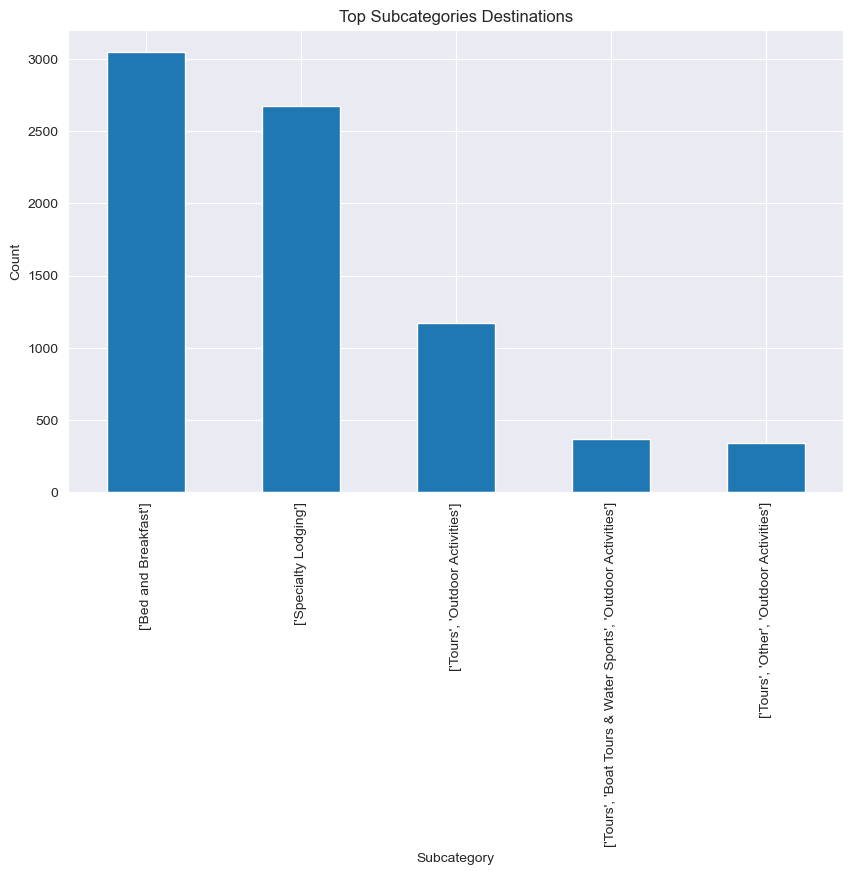

In [318]:
# Get value counts of production companies
subcategory_counts = clean_df['subcategories'].value_counts()

# Select the top 5 production companies
top_subcategories = subcategory_counts[1:6]

# Plot the top production companies
plt.figure(figsize=(10, 6))
top_subcategories.plot(kind='bar')
plt.title('Top Subcategories Destinations')
plt.xlabel('Subcategory')
plt.ylabel('Count')
plt.savefig('../Data/images/top_subcategories')
plt.show()

'Bed and Breakfast' and Specialty lodging are the top destination subcategories which are preferred by tourists.

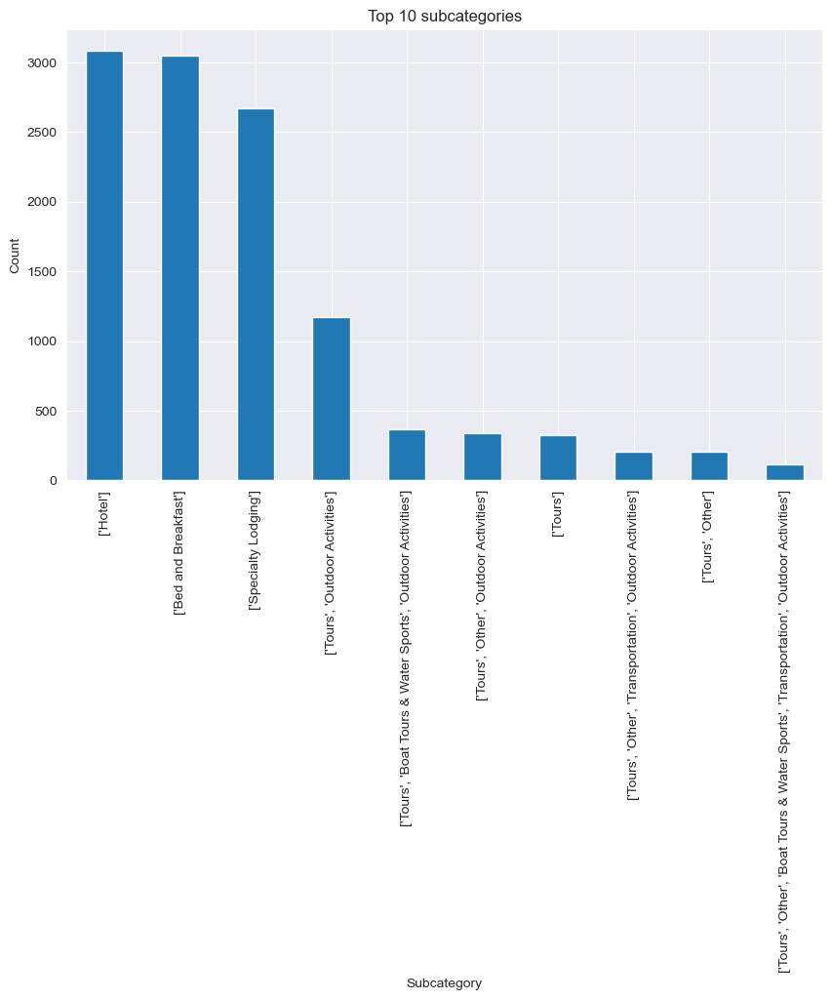

In [319]:
# Plotting 'Subcategoris' (top 10)
plt.figure(figsize=(10, 6))
top_10_subcategories = clean_df['subcategories'].explode().value_counts().head(10)
top_10_subcategories.plot(kind='bar')
plt.title('Top 10 subcategories')
plt.xlabel('Subcategory')
plt.ylabel('Count')
plt.savefig('../Data/images/top_10_subcategories_individually.png')
plt.show()

Columns to plot: Index(['id', 'rating', 'latitude', 'longitude', 'numberOfReviews',
       'LowerPrice', 'UpperPrice', 'Rank'],
      dtype='object')


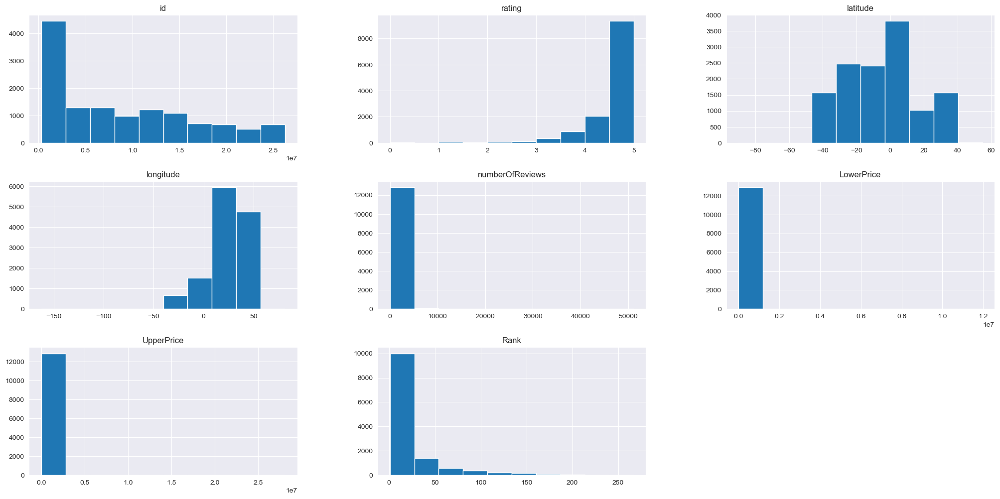

In [320]:
# Histogram plots for each data
# Select the numerical variables to plot
num_cols_to_plot = clean_df.select_dtypes(include=['int64', 'float64']).columns.drop([])
print("Columns to plot:",num_cols_to_plot )
# Create a histogram for each variable
clean_df[num_cols_to_plot].hist(figsize=(25, 12))
plt.savefig('../Data/images/Columnstoplot')
plt.show()

In [323]:
pip install stats


     ------------------------------------ 127.6/127.6 kB 141.8 kB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for stats: filename=stats-0.1.2a0-py3-none-any.whl size=24283 sha256=06f4a38d71b0b011e6ba99bf1e973ce8eefed577020eed4ebd744a5f00ab2042
  Stored in directory: c:\users\user pc\appdata\local\pip\cache\wheels\15\a4\f5\a7431ca9ac466505e866f76a55ae9f94192eafb0f634fce49f
Successfully built stats


In [331]:
from scipy.stats import zscore
from scipy import stats

In [334]:
pip install streamlit


  Using cached streamlit-1.24.1-py2.py3-none-any.whl (8.9 MB)
  Using cached altair-5.0.1-py3-none-any.whl (471 kB)
  Using cached blinker-1.6.2-py3-none-any.whl (13 kB)
     -------------------------------------- 21.5/21.5 MB 421.7 kB/s eta 0:00:00
     ------------------------------------ 164.8/164.8 kB 761.4 kB/s eta 0:00:00
     ------------------------------------ 239.4/239.4 kB 734.5 kB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ------------------------------------ 188.5/188.5 kB 600.2 kB/s eta 0:00:00
     ---------------------------------------- 4.8/4.8 MB 691.4 kB/s eta 0:00:00
     ---------------------------------------- 62.7/62.7 kB 1.6 MB/s eta 0:00:00
     -------------------------------------- 87.5/87.5 kB 413.3 kB/s eta 0:00:00
     ---------------------------------------- 1.1/1.1 MB 1.7 MB/s eta 0:00:00
     -------------------------------------- 341.8/341.8 kB 1.3 MB/s eta 0:00:00
  Created

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
spyder 5.2.2 requires pyqt5<5.13, which is not installed.
spyder 5.2.2 requires pyqtwebengine<5.13, which is not installed.


In [335]:
import streamlit as st
import folium

# Detect outliers using z-score method
zscore_threshold = 3  # Adjust this threshold based on your data and requirements
outliers = df[(df['latitude'] >= -35) & (df['latitude'] <= 37) & (df['longitude'] >= -25) & (df['longitude'] <= 60) &
                (np.abs(stats.zscore(df[['latitude', 'longitude']])) > zscore_threshold).any(axis=1)]

# Replace outliers with NaN values in the original DataFrame
df.loc[outliers.index, ['latitude', 'longitude']] = None

# Create a map centered at a specific location
map_center = [8, 20]
m = folium.Map(location=map_center, zoom_start=2)

# Add markers to the map for each location
for _, row in df.iterrows():
    lat, lon = row['latitude'], row['longitude']
    rating = row['rating']
    price = row['UpperPrice']
    ranking_type = row['RankingType']
    location_string = row['locationString']
    popup_text = f"Ranking Type: {ranking_type}, Location: {location_string}, Price: ${price}"

    if not pd.isnull(lat) and not pd.isnull(lon):
        folium.CircleMarker(
            location=[lat, lon],
            radius=5,
            color='blue',
            fill=True,
            fill_color='blue',
            popup=popup_text
        ).add_to(m)

# Display the map in Streamlit
st.markdown('<h1>Places to visit by Location</h1>', unsafe_allow_html=True)
st.markdown('<h3>Hover over the markers to see more details.</h3>', unsafe_allow_html=True)
st.write(m)


2023-07-12 11:03:49.947 
  command:

    streamlit run C:\Users\USER PC\anaconda3\lib\site-packages\ipykernel_launcher.py [ARGUMENTS]


In [332]:
# Detect outliers using z-score method
zscore_threshold = 3  # Adjust this threshold based on your data and requirements
outliers = df[(df['latitude'] >= -35) & (df['latitude'] <= 37) & (df['longitude'] >= -25) & (df['longitude'] <= 60) &
                (np.abs(stats.zscore(df[['latitude', 'longitude']])) > zscore_threshold).any(axis=1)]

# Replace outliers with NaN values in the original DataFrame
df.loc[outliers.index, ['latitude', 'longitude']] = None


# Define the map layout
layout = go.Layout(
    title='Places to visit by Location',
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        style='stamen-terrain',
        bearing=0,
        center=dict(lat=8, lon=20),
        pitch=0,
        zoom=2
    ),
)

# Define the map data as a scatter plot of the coordinates
data = go.Scattermapbox(
    lat=clean_df['latitude'],
    lon=clean_df['longitude'],
    mode='markers',
    marker=dict(
        size=5,
        color=clean_df['rating'],
        opacity=0.8
    ),
    text=['Price: ${}'.format(i) for i in clean_df['UpperPrice']],
    hovertext = clean_df.apply(lambda x: f"Ranking Type: ${x['RankingType']}, Location: {x['locationString']}", axis=1),
)


# Create the map figure and show it
fig = go.Figure(data=[data], layout=layout)
plt.savefig('../Data/images/map')
fig.show()

<Figure size 640x480 with 0 Axes>

We should begin by plotting a map of to show the distribution of our datapoints on the ground

In [300]:
# Define the map layout
layout = go.Layout(
    title='Places to visit by Location',
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        style='stamen-terrain',
        bearing=0,
        center=dict(
            lat=df['latitude'].median(),
            lon=df['longitude'].median()
        ),
        pitch=0,
        zoom=10
    ),
)
# Define the map data as a scatter plot of the coordinates
data = go.Scattermapbox(
    lat=df['latitude'],
    lon=df['longitude'],
    mode='markers',
    marker=dict(
        size=5,
        color=df['UpperPrice'],
        opacity=0.8
    ),
    text=['Price: ${}'.format(i) for i in df['UpperPrice']],
    hovertext = df.apply(lambda x: f"Ranking Type: ${x['RankingType']}, Name: {x['name']}", axis=1),
)
# Create the map figure and show it
fig = go.Figure(data=[data], layout=layout)
fig.show()

WARNING: the cell below uses folium and may be a bit taxing

In [311]:
# # Filter data by longitude and latitude range
data = df[(df['longitude'] >= -170) & (df['longitude'] <= 600) & (df['latitude'] >= -90) & (df['latitude'] <= 90)]

# # Create a map centered on the first point in the filtered data
map = folium.Map(location=[data.iloc[0]['latitude'], data.iloc[0]['longitude']])

# # Add markers for each point in the filtered data
for _, row in data.iterrows():
    folium.Marker(location=[row['latitude'], row['longitude']]).add_to(map)

# # Display the map
map

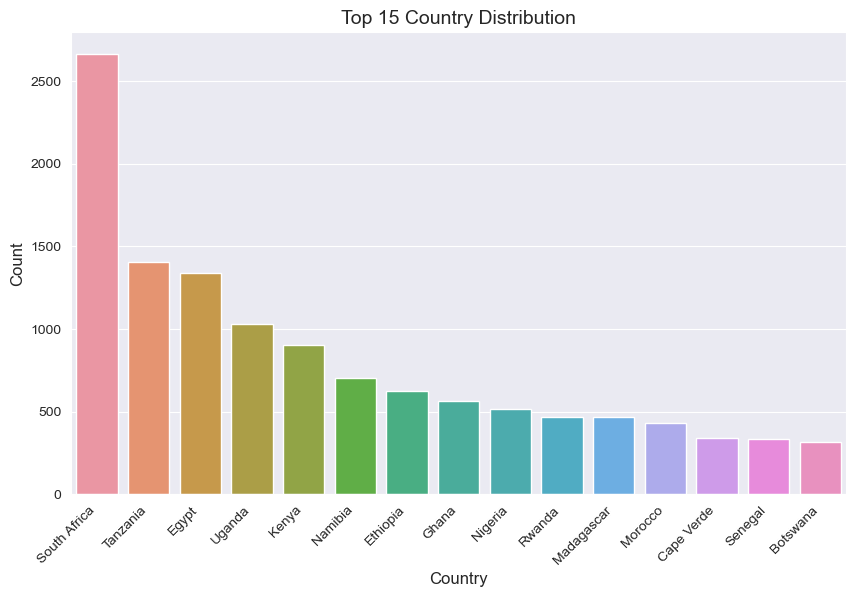

In [302]:
# Countplot of country distribution
country_counts = df['country'].value_counts().sort_values(ascending=False)
top_10_countries = country_counts.head(15)  # Select top 10 countries

sns.set_style("darkgrid")
plt.figure(figsize=(10, 6))  # Set the figure size
ax = sns.barplot(x=top_10_countries.index, y=top_10_countries.values)

ax.set_xlabel('Country', fontsize=12)  # Set x-axis label and fontsize
plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right')  # Rotate tick labels
ax.set_ylabel('Count', fontsize=12)  # Set y-axis label and fontsize
ax.set_title('Top 15 Country Distribution', fontsize=14)  # Set plot title

plt.show()

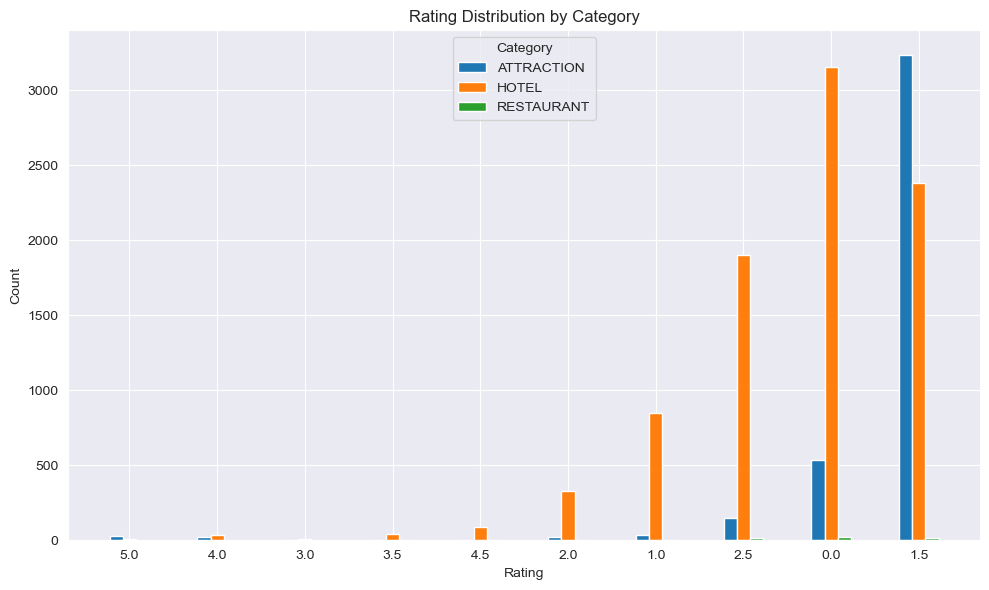

In [303]:
#visualizing ratings per tourist destination category 
# Group the ratings by category
grouped_data = df.groupby('type')['rating'].value_counts().unstack()
# Get unique categories and ratings
categories = df['type'].unique()
ratings = df['rating'].unique()
# Set the width of each bar
bar_width = 0.15
# Calculate the x position for each group of bars
x = np.arange(len(ratings))
# Create subplots
fig, ax = plt.subplots(figsize=(10, 6))
# Plot the bars for each category within each rating
for i, category in enumerate(categories):
    ax.bar(x + (i * bar_width), grouped_data.loc[category], width=bar_width, label=category)
    # Set the x-axis labels and ticks
    ax.set_xticks(x + ((len(categories) - 1) * bar_width) / 2)
    ax.set_xticklabels(ratings)
    ax.set_xlabel('Rating')
    ax.set_ylabel('Count')
    ax.set_title('Rating Distribution by Category')
    ax.legend(title='Category')
# Adjust the layout
plt.tight_layout()
# Show the plot
plt.show()

* From the chart above it can be seen that `hotel` category had higher ratings with an average rate of `4.0` followed by `attraction` while restaurants had lowest ratings based on categories over `3.5` 
* Despite having good ratings the same categories were rated poorly hith `hotel` and `attraction` trailing with rates of `1.5, 1.0` and `2.0` respectively. 

<function matplotlib.pyplot.show(close=None, block=None)>

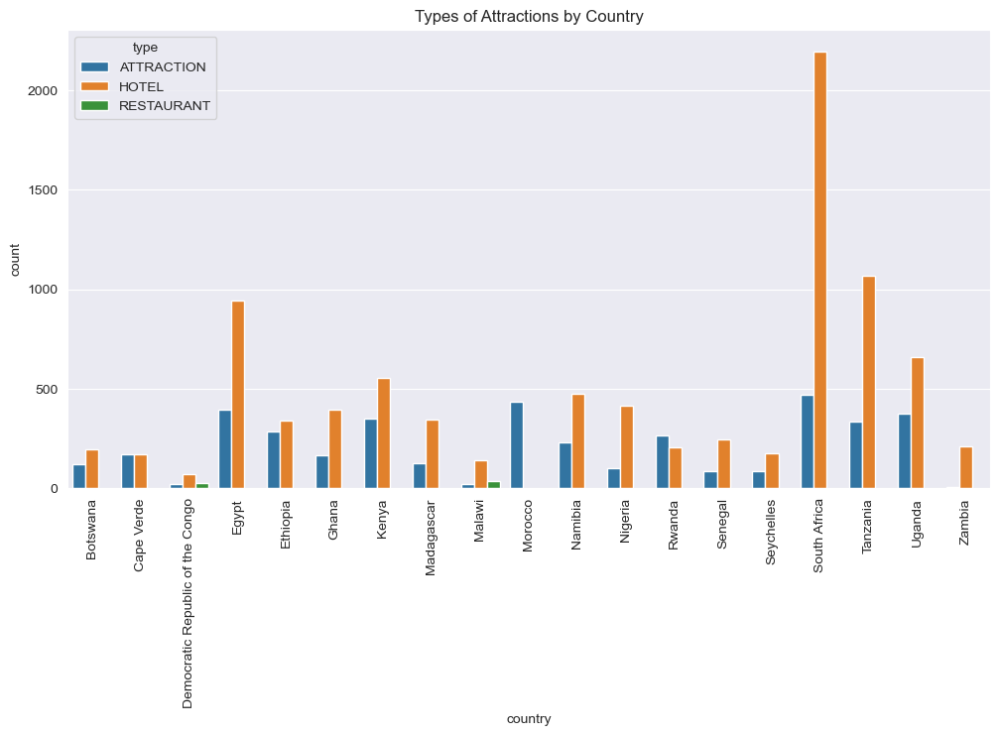

In [304]:
attractions_count = df.groupby(['country', 'type']).size().reset_index(name='count')

# Plot the count of attractions by country and category
plt.figure(figsize=(12, 6))
sns.barplot(x='country', y='count', hue='type', data=attractions_count)
# rotate x-axis labels
plt.xticks(rotation=90)
plt.title('Types of Attractions by Country')
plt.show

In [305]:
df

,id,type,subcategories,name,locationString,description,rating,phone,address,email,...,numberOfReviews,amenities,LowerPrice,UpperPrice,RankingType,Rank,Total,rankingtype,country,city
5,7945044,ATTRACTION,[Sights & Landmarks],Kuminda Farm,"Francistown, North-East District",It's a small farm and we are into Argo tourism...,5.0,+267 72 301 363,"Francistown/Nata Road Marobela Village, Franci...",kumindaculture@gmail.com,...,22,bathroom,141.000000,281.000000,things to do,1,3,things to do in Francistown,Botswana,Francistown
12,1743605,ATTRACTION,"[Casinos & Gambling, Fun & Games]",Gaborone Sun,"Gaborone, South-East District",Botswana is where the white-hot Kalahari Deser...,4.0,+267 361 6000,"Plot 4727 Chuma Drive, Gaborone 016 Botswana",mb_bw_Reservations@za.suninternational.com,...,124,bathroom,141.000000,281.000000,things to do,4,25,things to do in Gaborone,Botswana,Gaborone
13,4162082,HOTEL,[Specialty Lodging],Pelican Lodge & Camping,"Nata, Central District","The lodge is situated in Nata, Botswana. Clien...",3.0,+267 73 644 444,"A3 Road 6 kms south of Nata Village, Nata 0026...",reservations.pelicanlodge@thewildlodges.com,...,189,"[Pool, Internet, Free Internet, Free parking, ...",11533.000000,13361.000000,Specialty lodging,4,9,Specialty lodging in Nata,Botswana,Nata
15,1068835,HOTEL,[Bed and Breakfast],Serowe Hotel,"Serowe, Central District","Set in beautiful gardens, the Serowe Hotel is ...",3.5,+267 463 0234,"Main Road Kgope Ward, Serowe Botswana",reservations@serowehotel.com,...,79,"[Pool, Internet, Free parking, Restaurant, Bar...",6751.000000,6892.000000,Specialty lodging,1,7,B&Bs / Inns in Serowe,Botswana,Serowe
17,13477853,HOTEL,[Specialty Lodging],Leopard Plains,"Maun, Ngamiland East, North-West District",Experience in the middle of the bushveld a lux...,4.5,+264 81 148 4240,"A3, Maun, Ngamiland East Botswana",leopardplains@gmx.com,...,56,"[Pool, Restaurant, Wifi, Breakfast included, I...",32911.000000,41632.000000,Specialty lodging,10,81,Specialty lodging in Maun,Botswana,Maun
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35318,6427321,HOTEL,[Bed and Breakfast],Mumana Pleasure Resort,"Lusaka, Lusaka Province",Mumana Pleasure Resort is a 36 room resort wit...,2.0,+260 95 5291860,"Plot 38717 Great East Road, Lusaka 10100 Zambia",mukelabaism@yahoo.co.uk,...,4,"[Internet, Suites, Room service, Free parking,...",4923.000000,10549.000000,Specialty lodging,47,130,B&Bs / Inns in Lusaka,Zambia,Lusaka
35326,6542212,HOTEL,[Bed and Breakfast],Lima Garden Guest House,"Lusaka, Lusaka Province",See why so many travelers make Lima Garden Gue...,2.5,+260 21 1236701,"Plot 109A Garden, Lusaka 10100 Zambia",limagardengh@zamnet.zm,...,4,"[Pool, Room service, Restaurant, Air condition...",13777.392428,23045.636246,Specialty lodging,46,130,B&Bs / Inns in Lusaka,Zambia,Lusaka
35330,2666970,HOTEL,[Bed and Breakfast],Manda Hill Lodge,"Lusaka, Lusaka Province","Born in South Africa and taken to the world, N...",1.5,+260 96 2566733,18990 Corner of Mapepe and Parliament Road Oly...,info@accommodationlusaka.com,...,6,"[Internet, Kids Activities, Suites, Room servi...",6329.000000,12658.000000,Specialty lodging,48,130,B&Bs / Inns in Lusaka,Zambia,Lusaka
35331,8118425,HOTEL,[Bed and Breakfast],BestBed Executive Lodge,"Ndola, Copperbelt Province",See why so many travelers make BestBed Executi...,4.0,+260 95 3938153,Plot 9547 Hillcrest Road 300 m off Ndola Kitwe...,info@bestbedlodge.com,...,1,"[Kids Activities, Room service, Free parking, ...",13777.392428,23045.636246,Specialty lodging,9,21,B&Bs / Inns in Ndola,Zambia,Ndola


The columns `numerator` and `denomintor` are features that capture how popular a particular destination is in its `Location`. We can extract some information `regional_rating` by combining `numerator` and `denominator`

> **Some feature engineering** on above mentioned cols

In [306]:
# New feature we calculate the reciprocal since the Numerator/Denominator would result in lower ranked places
# getting higher values
df['regional_rating'] = (df['Denominator']/df['Numerator']).astype(float)
# Drop num and denom
df.drop(['Numerator', 'Denominator'], axis=1, inplace=True)
df.head()

KeyError: 'Denominator'

In [ ]:
#print current df
df

#### Visualizing  of top `Locations` per country

  Lets get a better sense of `Location`s per country.

In [ ]:
# How many locations per country
#list to hold top 5 locations and their counts for each country
top_5_locs_per_country = []
# for loop over top 10 countries
for country in top_10_countries.index:
    country_df = df.loc[df['country']==country].groupby(['Location'])['id'].count().sort_values(ascending=False)[:5]
    curr_top_5_locs = list(country_df.index)
    top_5_value_counts = list(country_df.values)
    top_5_dict = dict(zip(curr_top_5_locs, top_5_value_counts))
    top_5_locs_per_country.append({country: top_5_dict})
    

In [ ]:

# Loop over the list of dictionaries
for d in top_5_locs_per_country:
    # Get the country name and locations dictionary
    country, locations = list(d.items())[0]
    
    # Get the counts and labels for the pie chart
    counts = list(locations.values())
    labels = list(locations.keys())

    # Create the pie chart
    plt.figure(figsize=(6,6))
    plt.pie(counts, labels=labels, autopct='%1.1f%%', startangle=90)
    plt.title(f'Location Distribution in {country}')
    plt.axis('equal')
    sns.despine(left=True, bottom=True)
    plt.show()

In [ ]:
#current df
df

## Modelling

## Model Evaluation

## Tuning

## Deployment

## Conclusion and Recommendations